# Начало работы, загрузка библиотек

In [1]:
# устанавливаем пакеты

!pip install pandas 
!pip install numpy 
!pip install matplotlib 
!pip install sklearn
!pip install seaborn
!pip install pandas_profiling

In [2]:
# импортируем пакеты

import seaborn as sbn
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling as pp
import sklearn as skl
import random as rnd
import tensorflow as tf


In [3]:
# импортируем модули и объекты

from pandas import read_excel, DataFrame, Series
from pandas_profiling import ProfileReport 
from numpy.random import seed

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, Normalizer, PowerTransformer
from sklearn.model_selection import train_test_split, KFold, GridSearchCV, cross_val_score, cross_val_predict, StratifiedKFold, RandomizedSearchCV
from sklearn.linear_model import LinearRegression, LogisticRegression, Perceptron, SGDClassifier, ElasticNet
from sklearn import metrics 
from sklearn.svm import SVC, LinearSVC, SVR
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_squared_log_error, r2_score
from sklearn.inspection import permutation_importance
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import GenericUnivariateSelect, mutual_info_classif, SelectFromModel
from sklearn.neural_network import MLPRegressor

from tensorflow import keras 
from tensorflow.keras.layers import Dense 
from tensorflow.keras.layers import Flatten 

from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.layers import Activation, Dropout





In [4]:

# Отрисовываем график сразу в тетрадке, а не в отдельном окне

%matplotlib inline

# 1. Постановка задачи

#### Задача: Прогнозирование конечных свойств новых материалов (композиционных материалов).   

На входе имеются данные о начальных свойствах компонентов композиционных материалов (количество связующего, наполнителя, температурный режим отверждения и т.д.). На выходе необходимо спрогнозировать ряд конечных свойств получаемых композиционных материалов.  

На выходе (спрогнозировать): Соотношение матрица-наполнитель, Модуль упругости при растяжении, Прочность при растяжении


# 2. Получение данных, знакомство с данными

## 2.1 Загрузка данных

In [151]:
# подготавливаем путь
data_path_1 = '.\input\X_nup.xlsx'
data_path_1=data_path_1.replace('\\', '/')

data_path_2 = '.\input\X_bp.xlsx'
data_path_2=data_path_2.replace('\\', '/')

# производим загрузку датасета
data_set_1 = pd.read_excel(data_path_1)
data_set_2 = pd.read_excel(data_path_2)


# смотрим датасеты
print(data_set_1.head()) # первый датасет
data_set_2 # второй датасет


   Unnamed: 0  Угол нашивки, град  Шаг нашивки  Плотность нашивки
0         0.0                 0.0          4.0               57.0
1         1.0                 0.0          4.0               60.0
2         2.0                 0.0          4.0               70.0
3         3.0                 0.0          5.0               47.0
4         4.0                 0.0          5.0               57.0


,Unnamed: 0,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0,0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000
1,1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000
2,2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000
3,3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000
4,4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000
...,...,...,...,...,...,...,...,...,...,...,...
1018,1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669
1019,1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099
1020,1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764
1021,1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067


In [6]:
# Разведочный анализ данных средствами pandas 1 набора данных

ProfileReport(data_set_1)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# Разведочный анализ данных средствами pandas 2 набора данных

ProfileReport(data_set_2)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. Подготовка, очистка, нормализация данных

In [255]:
#Объединение файлов 1 и 2 
data_set_0 = data_set_2.merge(data_set_1, left_index = True, right_index = True, how = 'inner')

data_set_0

,Unnamed: 0_x,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Unnamed: 0_y,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,0.0,4.000000,57.000000
1,1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,1.0,0.0,4.000000,60.000000
2,2.0,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,2.0,0.0,4.000000,70.000000
3,3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,3.0,0.0,5.000000,47.000000
4,4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,4.0,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1018.0,90.0,9.076380,47.019770
1019,1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1019.0,90.0,10.565614,53.750790
1020,1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1020.0,90.0,4.161154,67.629684
1021,1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1021.0,90.0,6.313201,58.261074


Общее количество данных

1023 rows × 15 columns

In [256]:
# выводим все пропущенные значения

data_set_0.isnull().mean() * 100

Unnamed: 0_x                            0.0
Соотношение матрица-наполнитель         0.0
Плотность, кг/м3                        0.0
модуль упругости, ГПа                   0.0
Количество отвердителя, м.%             0.0
Содержание эпоксидных групп,%_2         0.0
Температура вспышки, С_2                0.0
Поверхностная плотность, г/м2           0.0
Модуль упругости при растяжении, ГПа    0.0
Прочность при растяжении, МПа           0.0
Потребление смолы, г/м2                 0.0
Unnamed: 0_y                            0.0
Угол нашивки, град                      0.0
Шаг нашивки                             0.0
Плотность нашивки                       0.0
dtype: float64

In [257]:
# удаляем столбцы с индексом

data_set_0 = data_set_0.drop(['Unnamed: 0_x','Unnamed: 0_y'], axis=1)

In [258]:
# готовим копию датасета для эксперементов
data_set=data_set_0
data_set

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.000000,738.736842,30.000000,22.267857,100.000000,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,57.000000
1,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,60.000000
2,1.857143,2030.000000,738.736842,49.900000,33.000000,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,4.000000,70.000000
3,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,47.000000
4,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0.0,5.000000,57.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,90.0,9.076380,47.019770
1019,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,90.0,10.565614,53.750790
1020,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,90.0,4.161154,67.629684
1021,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,90.0,6.313201,58.261074


In [278]:
# округляем данные в датасете


data_set=data_set.apply(np.rint)


data_set

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,2.0,2030.0,739.0,30.0,22.0,100.0,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1,2.0,2030.0,739.0,50.0,24.0,285.0,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2,2.0,2030.0,739.0,50.0,33.0,285.0,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3,2.0,2030.0,739.0,129.0,21.0,300.0,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4,3.0,2030.0,753.0,112.0,22.0,285.0,210.0,70.0,3000.0,220.0,0.0,5.0,57.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.0,1952.0,913.0,87.0,20.0,325.0,209.0,73.0,2387.0,125.0,90.0,9.0,47.0
1019,3.0,2050.0,445.0,146.0,20.0,254.0,351.0,73.0,2360.0,118.0,90.0,11.0,54.0
1020,3.0,1972.0,417.0,111.0,24.0,248.0,740.0,75.0,2663.0,237.0,90.0,4.0,68.0
1021,4.0,2067.0,741.0,141.0,19.0,276.0,641.0,74.0,2072.0,197.0,90.0,6.0,58.0


In [279]:
# отбираем дубли
bool_series = data_set.duplicated(subset=['Соотношение матрица-наполнитель','Прочность при растяжении, МПа','Модуль упругости при растяжении, ГПа'],keep = False)

# просматриваем данные с дублями
data_set[bool_series].shape

(35, 13)

In [280]:
# передача НЕ серии bool для просмотра только уникальных значений

data_set = data_set[~bool_series]
data_set

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
7,3.0,1900.0,535.0,112.0,22.0,285.0,380.0,75.0,1800.0,120.0,0.0,7.0,47.0
13,3.0,1980.0,568.0,129.0,21.0,300.0,470.0,73.0,2456.0,220.0,0.0,9.0,60.0
16,4.0,1880.0,313.0,129.0,21.0,300.0,210.0,70.0,3000.0,220.0,0.0,10.0,57.0
18,5.0,1890.0,540.0,129.0,21.0,300.0,380.0,75.0,1800.0,120.0,0.0,10.0,70.0
23,3.0,1953.0,1137.0,138.0,22.0,235.0,556.0,81.0,2587.0,247.0,90.0,4.0,70.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.0,1952.0,913.0,87.0,20.0,325.0,209.0,73.0,2387.0,125.0,90.0,9.0,47.0
1019,3.0,2050.0,445.0,146.0,20.0,254.0,351.0,73.0,2360.0,118.0,90.0,11.0,54.0
1020,3.0,1972.0,417.0,111.0,24.0,248.0,740.0,75.0,2663.0,237.0,90.0,4.0,68.0
1021,4.0,2067.0,741.0,141.0,19.0,276.0,641.0,74.0,2072.0,197.0,90.0,6.0,58.0


In [281]:
# Производим удаление дублей

# data_set = data_set.drop_duplicates()
 #data_set.shape

IndentationError: unexpected indent (Temp/ipykernel_18292/3571532657.py, line 4)

In [282]:
# смотрим попарную корреляцию

data_set.corr()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
Соотношение матрица-наполнитель,1.000000,0.008122,0.020793,0.009108,0.028003,-0.015097,-0.004658,-0.011436,0.042501,0.075761,-0.028175,0.026692,0.004435
"Плотность, кг/м3",0.008122,1.000000,-0.019892,-0.030588,-0.008351,-0.011807,0.041099,-0.019602,-0.074846,-0.024899,-0.066453,-0.061235,0.084912
"модуль упругости, ГПа",0.020793,-0.019892,1.000000,0.021426,-0.002155,0.034762,-0.014928,0.010924,0.052898,-0.005808,-0.015927,-0.009786,0.057796
"Количество отвердителя, м.%",0.009108,-0.030588,0.021426,1.000000,0.016232,0.077664,0.044041,-0.079756,-0.061268,0.002558,0.040973,0.008434,0.022268
"Содержание эпоксидных групп,%_2",0.028003,-0.008351,-0.002155,0.016232,1.000000,-0.015688,0.000548,0.066952,-0.034314,0.011368,0.008463,0.016792,-0.039444
"Температура вспышки, С_2",-0.015097,-0.011807,0.034762,0.077664,-0.015688,1.000000,0.019776,0.017904,-0.032392,0.068161,0.019429,0.017479,0.009028
"Поверхностная плотность, г/м2",-0.004658,0.041099,-0.014928,0.044041,0.000548,0.019776,1.000000,0.017881,0.024248,-0.005072,0.057054,0.039401,-0.039493
"Модуль упругости при растяжении, ГПа",-0.011436,-0.019602,0.010924,-0.079756,0.066952,0.017904,0.017881,1.000000,0.006908,0.047708,0.029590,-0.033474,0.006967
"Прочность при растяжении, МПа",0.042501,-0.074846,0.052898,-0.061268,-0.034314,-0.032392,0.024248,0.006908,1.000000,0.041032,0.016844,-0.052302,0.012679
"Потребление смолы, г/м2",0.075761,-0.024899,-0.005808,0.002558,0.011368,0.068161,-0.005072,0.047708,0.041032,1.000000,-0.007255,0.009153,0.021189


In [283]:
data_set

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
7,3.0,1900.0,535.0,112.0,22.0,285.0,380.0,75.0,1800.0,120.0,0.0,7.0,47.0
13,3.0,1980.0,568.0,129.0,21.0,300.0,470.0,73.0,2456.0,220.0,0.0,9.0,60.0
16,4.0,1880.0,313.0,129.0,21.0,300.0,210.0,70.0,3000.0,220.0,0.0,10.0,57.0
18,5.0,1890.0,540.0,129.0,21.0,300.0,380.0,75.0,1800.0,120.0,0.0,10.0,70.0
23,3.0,1953.0,1137.0,138.0,22.0,235.0,556.0,81.0,2587.0,247.0,90.0,4.0,70.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,2.0,1952.0,913.0,87.0,20.0,325.0,209.0,73.0,2387.0,125.0,90.0,9.0,47.0
1019,3.0,2050.0,445.0,146.0,20.0,254.0,351.0,73.0,2360.0,118.0,90.0,11.0,54.0
1020,3.0,1972.0,417.0,111.0,24.0,248.0,740.0,75.0,2663.0,237.0,90.0,4.0,68.0
1021,4.0,2067.0,741.0,141.0,19.0,276.0,641.0,74.0,2072.0,197.0,90.0,6.0,58.0


C:\ProgramData\Anaconda3\lib\site-packages\seaborn\axisgrid.py:2076: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


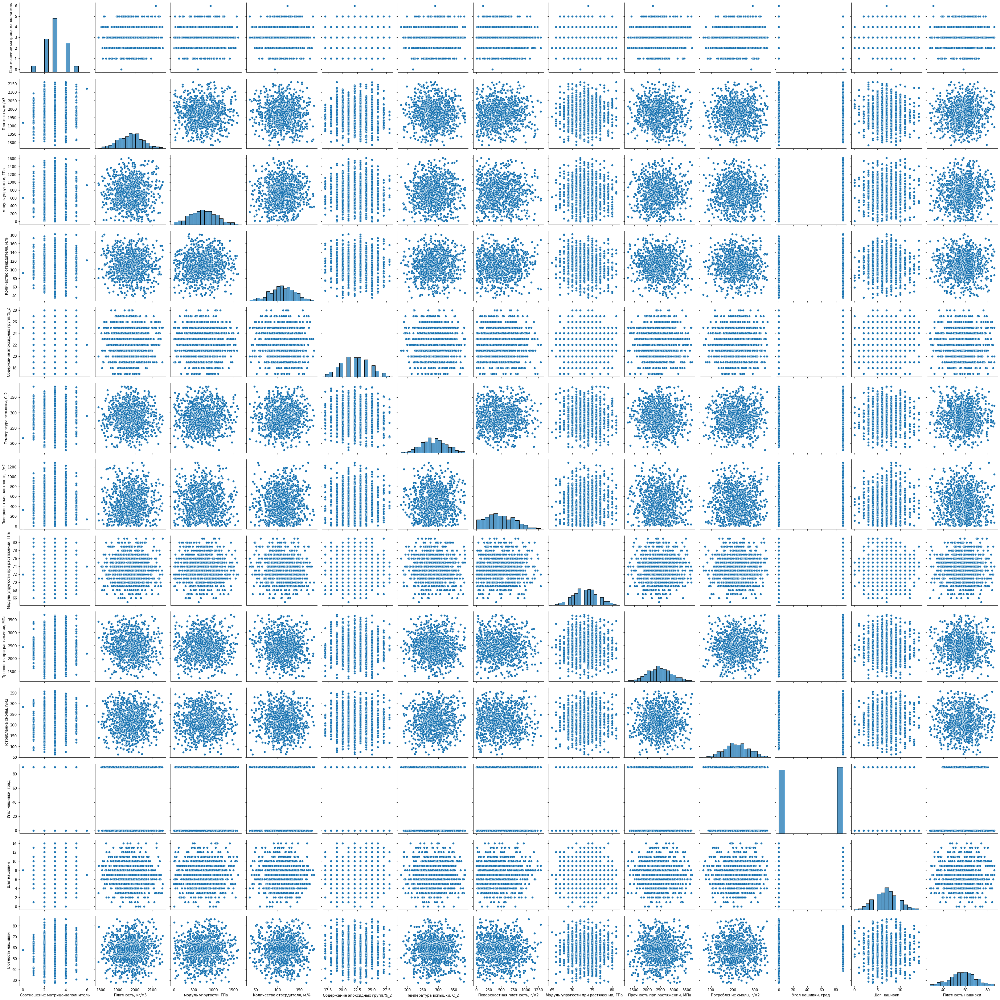

In [300]:
# отображаем все числовые столбцы данных на обеих осях, выводим матрицу зависимостей

sbn.pairplot(data_set, size=3)
plt.savefig('data_set.png')

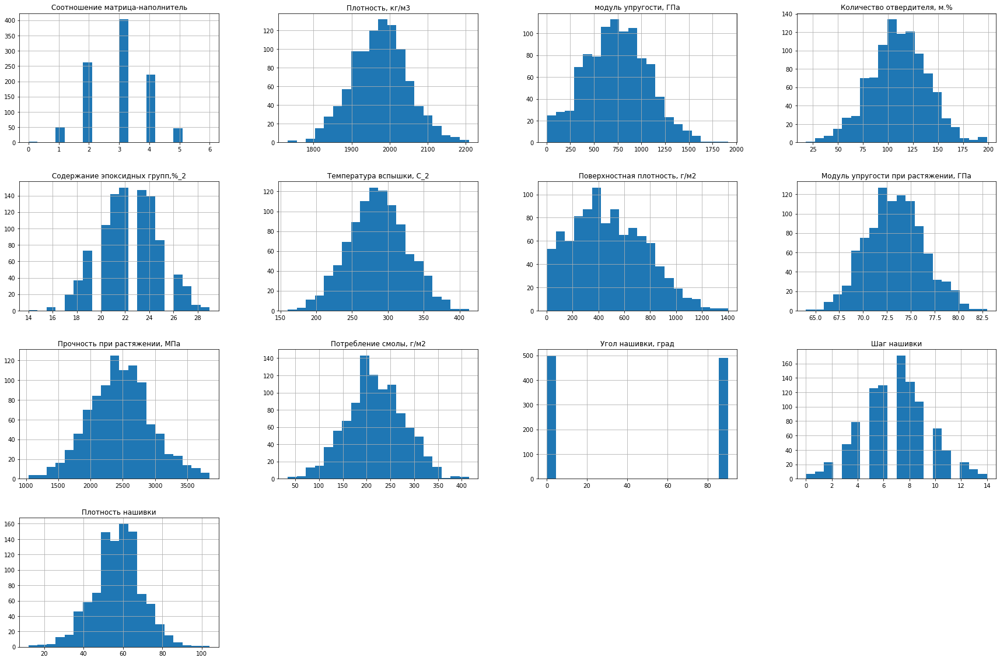

In [287]:
# построим гистограммы, показывающие распределение показателей

data_set.hist(figsize = (30, 20), bins=20)
plt.show()

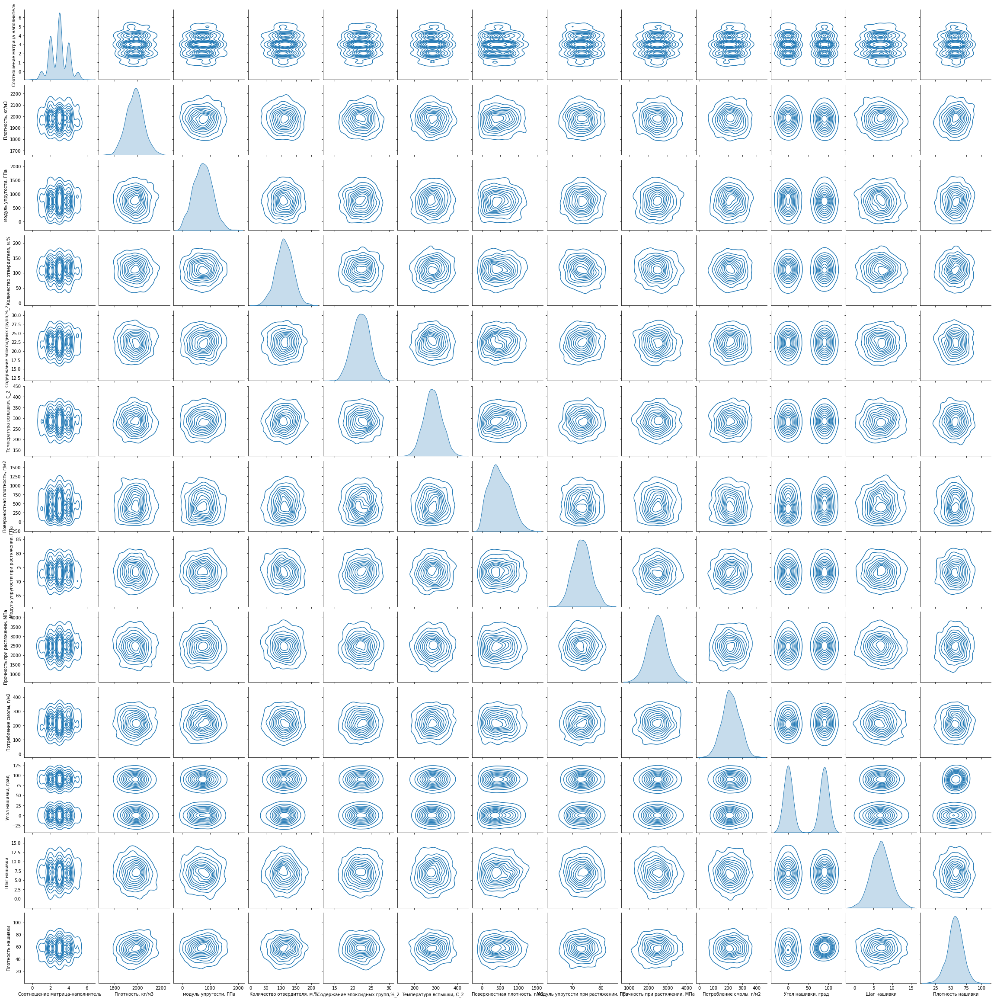

In [288]:
# смотрим зависимости

sbn.pairplot(data_set, kind = 'kde') 
# displaying the plot 
plt.show() 

In [286]:
# просматриваем информацию о столбцах

data_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 988 entries, 7 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       988 non-null    float64
 1   Плотность, кг/м3                      988 non-null    float64
 2   модуль упругости, ГПа                 988 non-null    float64
 3   Количество отвердителя, м.%           988 non-null    float64
 4   Содержание эпоксидных групп,%_2       988 non-null    float64
 5   Температура вспышки, С_2              988 non-null    float64
 6   Поверхностная плотность, г/м2         988 non-null    float64
 7   Модуль упругости при растяжении, ГПа  988 non-null    float64
 8   Прочность при растяжении, МПа         988 non-null    float64
 9   Потребление смолы, г/м2               988 non-null    float64
 10  Угол нашивки, град                    988 non-null    float64
 11  Шаг нашивки       

In [209]:
# выводим информацию о числовых параметрах

data_set.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,989.000000,989.000000,989.000000,989.000000,989.000000,989.000000,989.000000,989.000000,989.000000,989.000000,989.000000,989.000000,989.000000
mean,2.947422,1975.213347,737.678463,110.697674,22.231547,285.777553,484.828109,73.349848,2460.785642,218.617796,44.499494,6.921132,57.157735
std,0.952976,74.164878,330.280358,28.262552,2.431652,40.827387,280.839839,3.165949,485.028275,59.998478,45.019983,2.582220,12.347507
min,0.000000,1732.000000,2.000000,18.000000,14.000000,160.000000,1.000000,64.000000,1037.000000,34.000000,0.000000,0.000000,12.000000
25%,2.000000,1924.000000,498.000000,92.000000,21.000000,258.000000,269.000000,71.000000,2134.000000,179.000000,0.000000,5.000000,50.000000
50%,3.000000,1977.000000,738.000000,110.000000,22.000000,286.000000,454.000000,73.000000,2456.000000,217.000000,0.000000,7.000000,57.000000
75%,4.000000,2021.000000,957.000000,130.000000,24.000000,313.000000,695.000000,75.000000,2757.000000,259.000000,90.000000,9.000000,65.000000
max,6.000000,2208.000000,1912.000000,199.000000,29.000000,413.000000,1400.000000,83.000000,3848.000000,415.000000,90.000000,14.000000,104.000000


Count — количество значений.  
Mean — среднее значение.  
Std — стандартное отклонение значения.  
Min — минимальное значение.  
Max — максимальное значение.  
25% — первый квартиль, означающий, что 25% значений в столбце ниже этого значения.  
50% — медиана, означающая, что половина значений в столбце ниже этого значения.  
75% — третий квартиль, означающий, что 75% значений в столбце ниже этого значения.  

In [210]:
# выводим список столбцов

for col in data_set.columns:
    print(col)

Соотношение матрица-наполнитель
Плотность, кг/м3
модуль упругости, ГПа
Количество отвердителя, м.%
Содержание эпоксидных групп,%_2
Температура вспышки, С_2
Поверхностная плотность, г/м2
Модуль упругости при растяжении, ГПа
Прочность при растяжении, МПа
Потребление смолы, г/м2
Угол нашивки, град
Шаг нашивки
Плотность нашивки


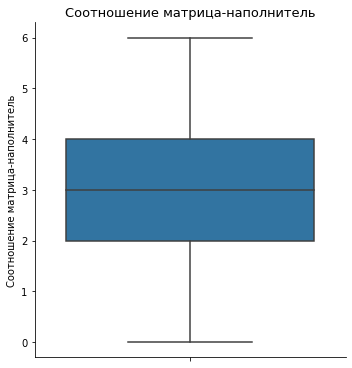

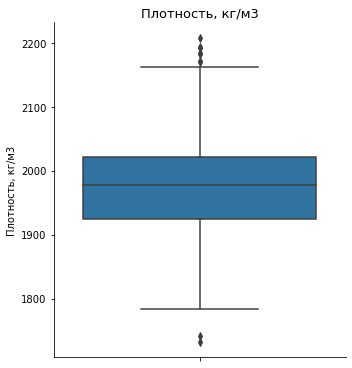

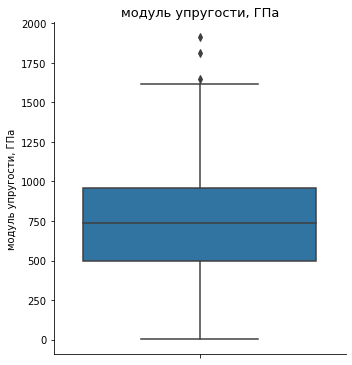

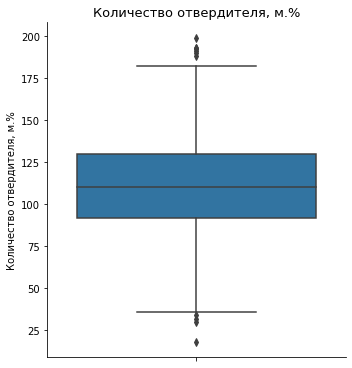

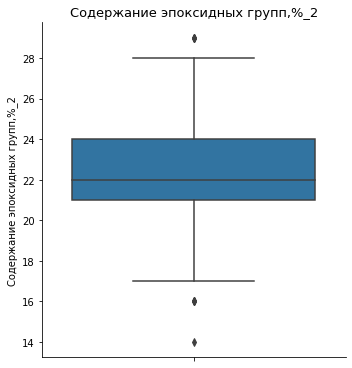

...

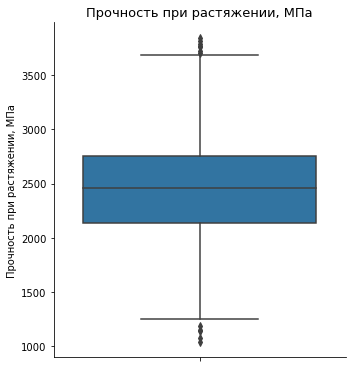

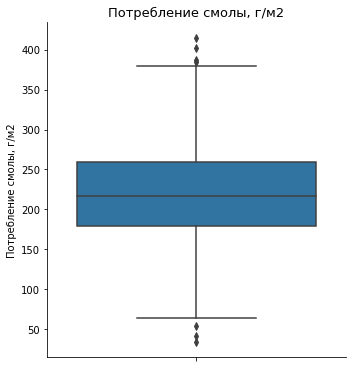

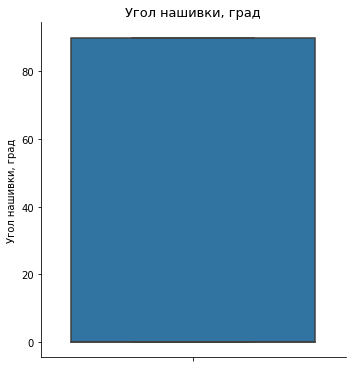

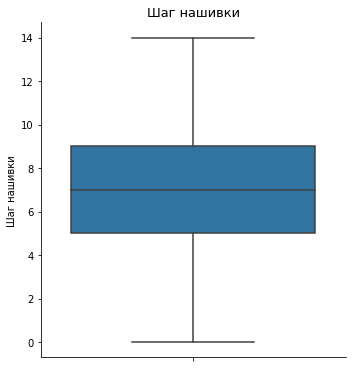

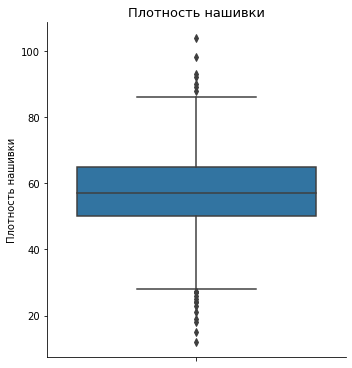

In [211]:
# производим проверку распределения одномерных вероятностей (Рисуем ящики с усами)

for col in data_set.columns:
        sbn.catplot(y = col, data = data_set, kind = 'box')
        plt.title(col, fontsize = 13) 

Ящики с усами показали наличие выбросов, производим удаление выбросов. Выбросом считается, значение в 1,5 раза больше или меньше разности 1-го и 3-го квартиля

In [291]:

#Удаляем выбросы

for x in data_set.columns:
    q75,q25 = np.percentile(data_set.loc[:,x],[75,25])
    intr_qr = q75-q25

    max = q75+(1.5*intr_qr)
    min = q25-(1.5*intr_qr)

    data_set.loc[data_set[x] < min,x] = np.nan
    data_set.loc[data_set[x] > max,x] = np.nan

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


In [292]:
# подсчитываем количество нулевых значений

data_set.isnull().sum()

Соотношение матрица-наполнитель          0
Плотность, кг/м3                         9
модуль упругости, ГПа                    3
Количество отвердителя, м.%             11
Содержание эпоксидных групп,%_2          9
Температура вспышки, С_2                 7
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     5
Прочность при растяжении, МПа           12
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              0
Плотность нашивки                       21
dtype: int64

In [293]:
#Так как количество с пробелами незначительное, решаем удалить данные

data_set = data_set.dropna(axis = 0)

In [215]:
# выводим информацию о датасете

data_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 906 entries, 7 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       906 non-null    float64
 1   Плотность, кг/м3                      906 non-null    float64
 2   модуль упругости, ГПа                 906 non-null    float64
 3   Количество отвердителя, м.%           906 non-null    float64
 4   Содержание эпоксидных групп,%_2       906 non-null    float64
 5   Температура вспышки, С_2              906 non-null    float64
 6   Поверхностная плотность, г/м2         906 non-null    float64
 7   Модуль упругости при растяжении, ГПа  906 non-null    float64
 8   Прочность при растяжении, МПа         906 non-null    float64
 9   Потребление смолы, г/м2               906 non-null    float64
 10  Угол нашивки, град                    906 non-null    float64
 11  Шаг нашивки       

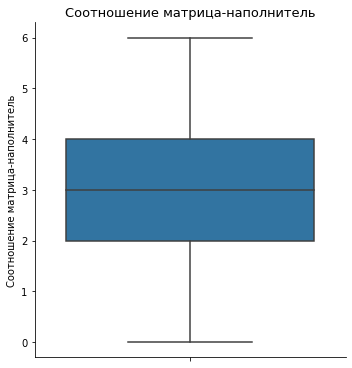

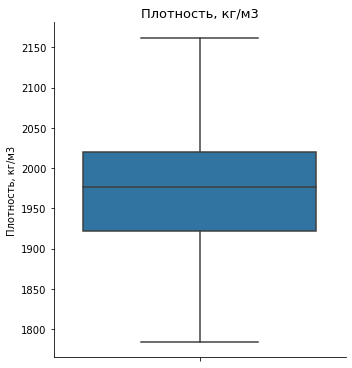

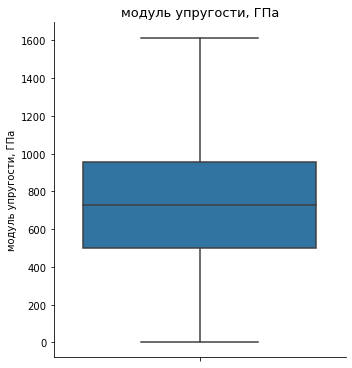

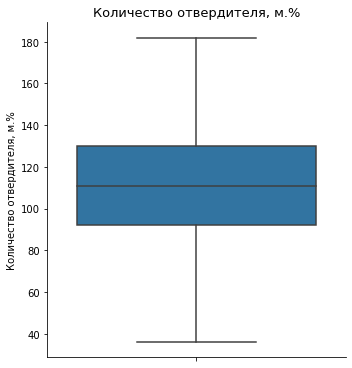

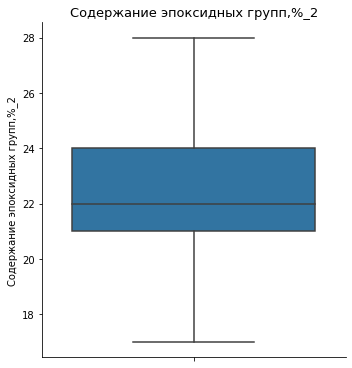

...

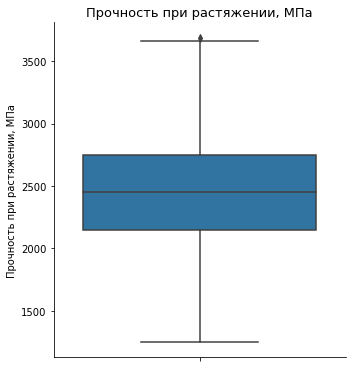

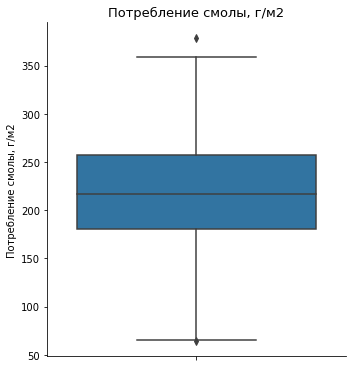

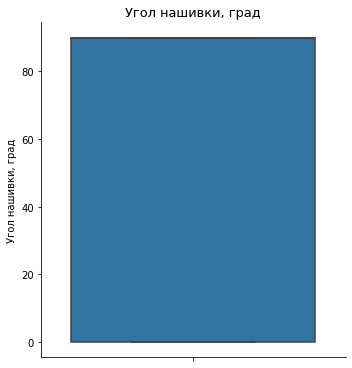

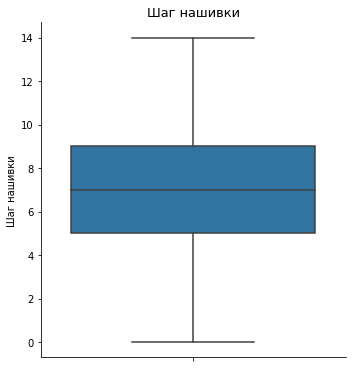

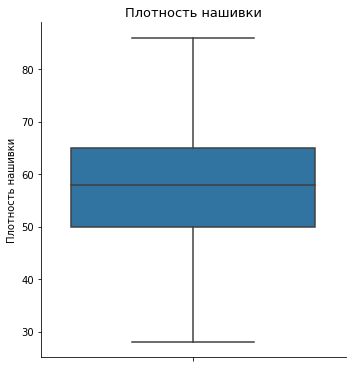

In [216]:
# производим проверку распределения после выборосов

for col in data_set.columns:
        sbn.catplot(y = col, data = data_set, kind = 'box')
        plt.title(col, fontsize = 13) 

In [294]:
# Нормализуем данные с помощью метода MinMaxScaler
# Преобразование показателей путем масштабирования до заданного диапазона. По умолчанию от 0 до 1

scaler = MinMaxScaler()
DS_n = pd.DataFrame(scaler.fit_transform(data_set),
           columns = data_set.columns, index = data_set.index)
DS_n

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
7,0.500000,0.306878,0.330440,0.520548,0.454545,0.512077,0.293798,0.6250,0.225502,0.189831,0.0,0.500000,0.327586
13,0.500000,0.518519,0.350899,0.636986,0.363636,0.584541,0.363566,0.5000,0.494465,0.528814,0.0,0.642857,0.551724
16,0.666667,0.253968,0.192808,0.636986,0.363636,0.584541,0.162016,0.3125,0.717507,0.528814,0.0,0.714286,0.500000
18,0.833333,0.280423,0.333540,0.636986,0.363636,0.584541,0.293798,0.6250,0.225502,0.189831,0.0,0.714286,0.724138
23,0.500000,0.447090,0.703658,0.698630,0.454545,0.270531,0.430233,1.0000,0.548175,0.620339,1.0,0.285714,0.724138
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.333333,0.444444,0.564786,0.349315,0.272727,0.705314,0.161240,0.5000,0.466175,0.206780,1.0,0.642857,0.327586
1019,0.500000,0.703704,0.274644,0.753425,0.272727,0.362319,0.271318,0.5000,0.455105,0.183051,1.0,0.785714,0.448276
1020,0.500000,0.497354,0.257285,0.513699,0.636364,0.333333,0.572868,0.6250,0.579336,0.586441,1.0,0.285714,0.689655
1021,0.666667,0.748677,0.458153,0.719178,0.181818,0.468599,0.496124,0.5625,0.337023,0.450847,1.0,0.428571,0.517241


Смотрим зависимости нормализованного датасета

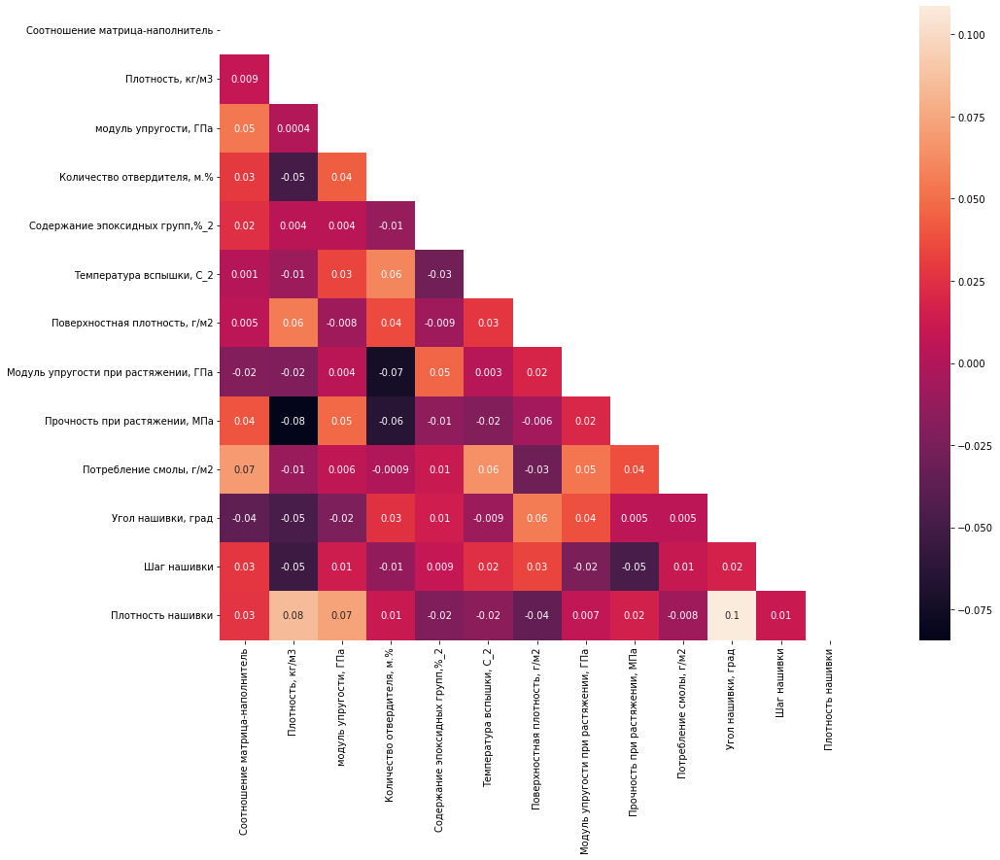

In [295]:
# строим телопвую карту попарной коррекляции нормализованного датасета


fig, ax = plt.subplots(figsize=(24,12))
matrix = np.triu(DS_n.corr())
sbn.heatmap(DS_n.corr(),  annot=True, square=True, mask=matrix,fmt='.1g');



Видим, что данные плохо коррелируются между собой, самый высокий коээфициент 0,08. Тогда как коэффициент должен стремиться к 1.

# 4. Анализ и выявление закономерностей

In [220]:
#смотрим статистику по нормализованным данным без выборосов

DS_n.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000,906.000000
mean,0.493745,0.501381,0.454232,0.512421,0.473109,0.514887,0.372811,0.519178,0.497144,0.490399,0.511038,0.496610,0.507308
std,0.157357,0.189341,0.202451,0.186122,0.214944,0.192452,0.216174,0.192674,0.188612,0.184294,0.500154,0.184300,0.195637
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.333333,0.365079,0.307657,0.385274,0.363636,0.381643,0.206395,0.375000,0.367261,0.368254,0.000000,0.357143,0.379310
50%,0.500000,0.510582,0.451333,0.513699,0.454545,0.516908,0.350388,0.500000,0.494055,0.485714,1.000000,0.500000,0.517241
75%,0.666667,0.624339,0.591909,0.643836,0.636364,0.647343,0.537403,0.625000,0.615826,0.612698,1.000000,0.642857,0.637931
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


Выводим графики зависимости для каждого выходного параметра

Соотношение матрица-наполнитель


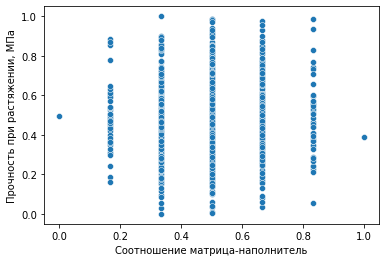




Плотность, кг/м3


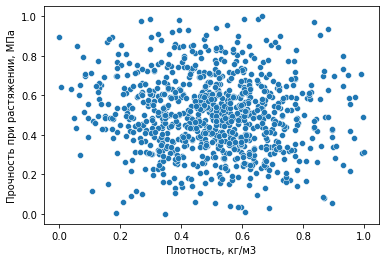




модуль упругости, ГПа


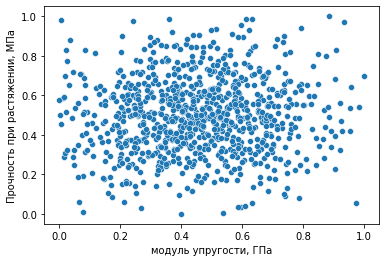




Количество отвердителя, м.%


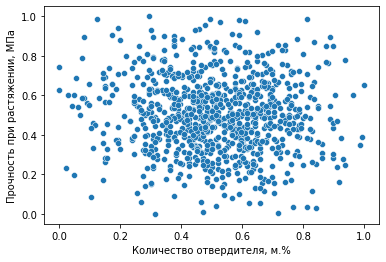




Содержание эпоксидных групп,%_2


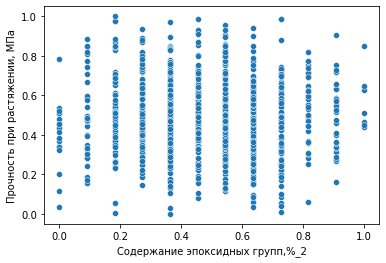




Температура вспышки, С_2


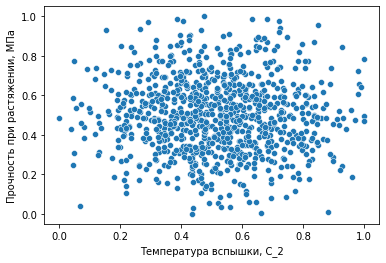




Поверхностная плотность, г/м2


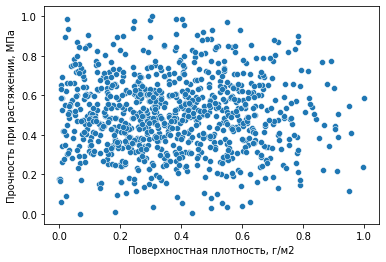




Модуль упругости при растяжении, ГПа


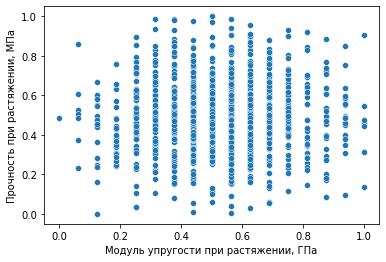




Прочность при растяжении, МПа


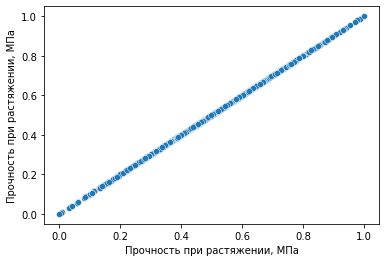




Потребление смолы, г/м2


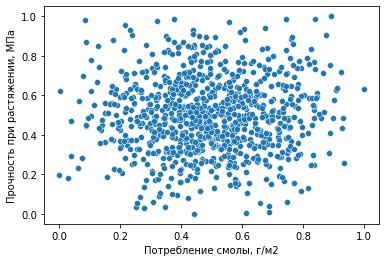




Угол нашивки, град


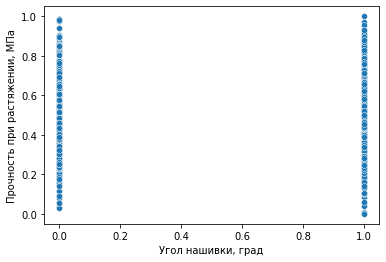




Шаг нашивки


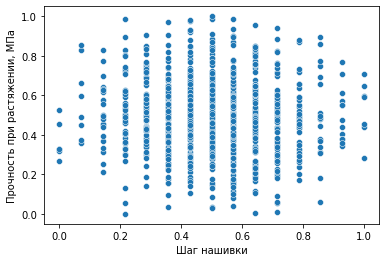




Плотность нашивки


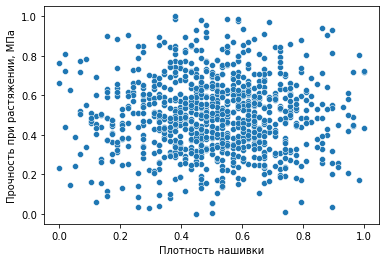

In [221]:
# Смотрим зависимости для "Прочность при растяжении, МПа"

for column in DS_n:
    print(column)
    sbn.scatterplot(x = column , y = "Прочность при растяжении, МПа", data = DS_n);
    plt.show()
    print('\n\n')

Линейной зависимости для показателя 'Прочность при растяжении, МПа' не видим

Соотношение матрица-наполнитель


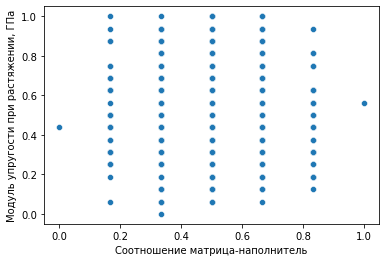




Плотность, кг/м3


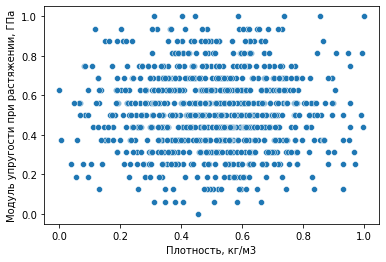




модуль упругости, ГПа


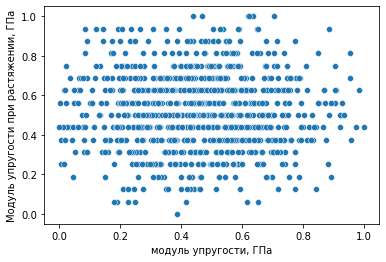




Количество отвердителя, м.%


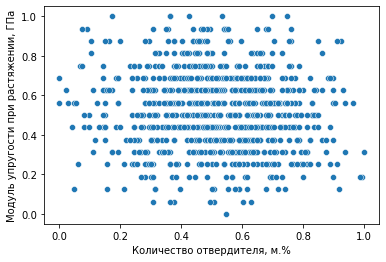




Содержание эпоксидных групп,%_2


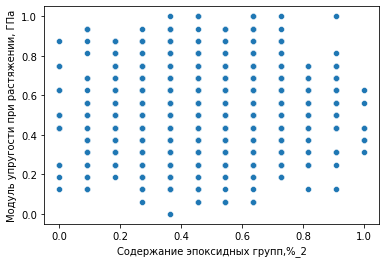




Температура вспышки, С_2


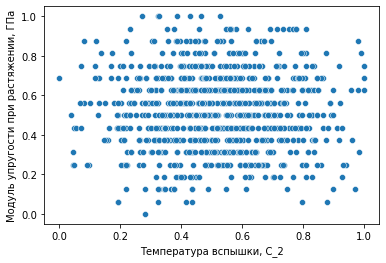




Поверхностная плотность, г/м2


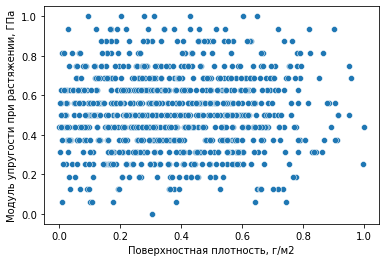




Модуль упругости при растяжении, ГПа


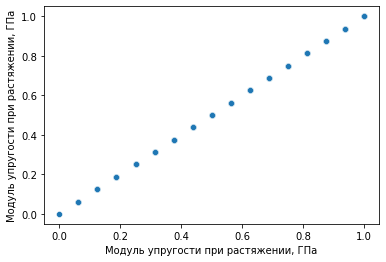




Прочность при растяжении, МПа


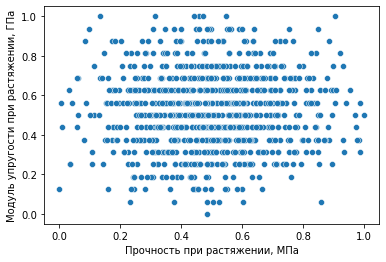




Потребление смолы, г/м2


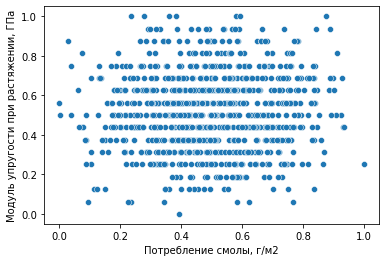




Угол нашивки, град


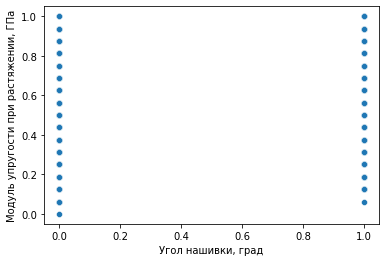




Шаг нашивки


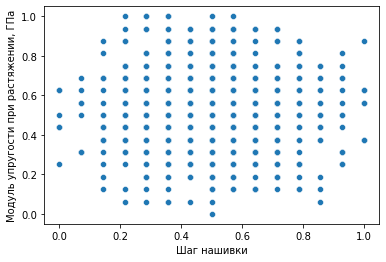




Плотность нашивки


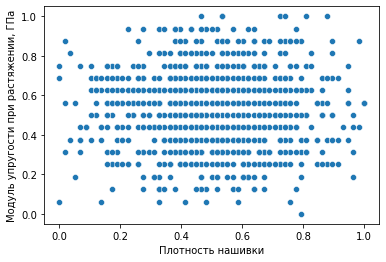

In [222]:
# Смотрим зависимости для "Модуль упругости при растяжении, ГПа"

for column in DS_n:
    print(column)
    sbn.scatterplot(x = column , y = "Модуль упругости при растяжении, ГПа", data = DS_n);
    plt.show()
    print('\n\n')

Соотношение матрица-наполнитель


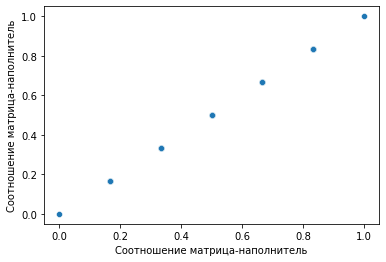




Плотность, кг/м3


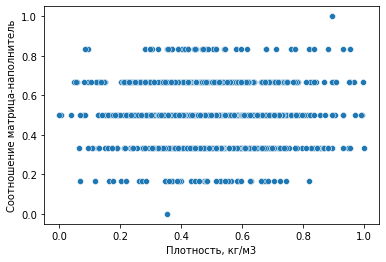




модуль упругости, ГПа


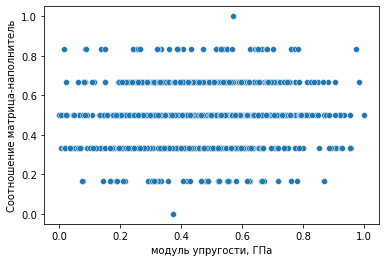




Количество отвердителя, м.%


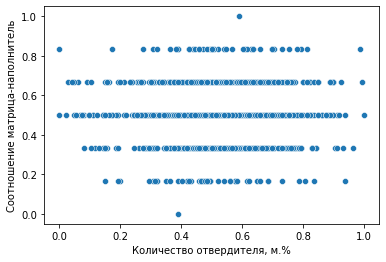




Содержание эпоксидных групп,%_2


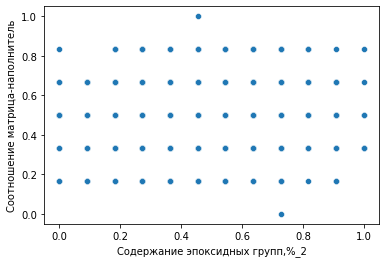




Температура вспышки, С_2


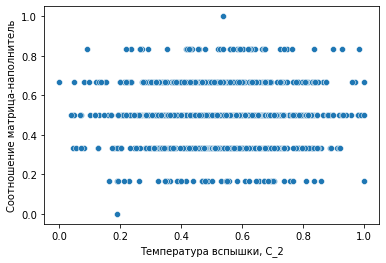




Поверхностная плотность, г/м2


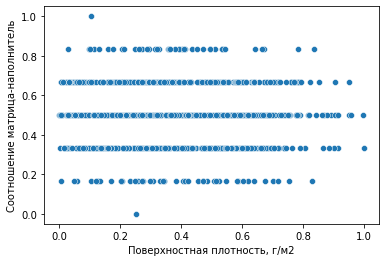




Модуль упругости при растяжении, ГПа


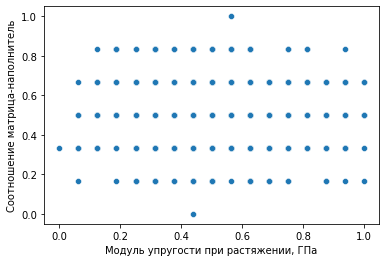




Прочность при растяжении, МПа


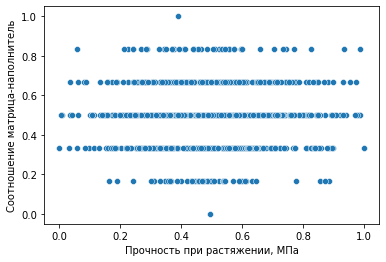




Потребление смолы, г/м2


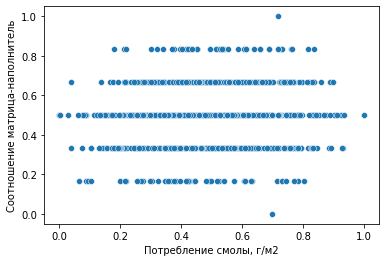




Угол нашивки, град


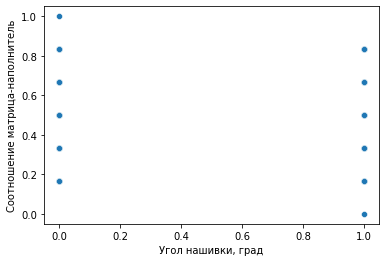




Шаг нашивки


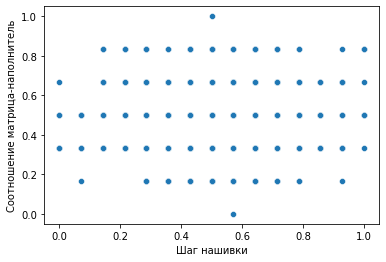




Плотность нашивки


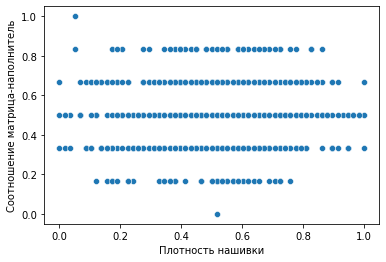

In [223]:
# Смотрим зависимости для "Соотношение матрица-наполнитель"

for column in DS_n:
    print(column)
    sbn.scatterplot(x = column , y = "Соотношение матрица-наполнитель", data = DS_n);
    plt.show()
    print('\n\n')

In [224]:
# Для удобства повторно выводим список столбцов

for col in DS_n.columns:
    print(col)

Соотношение матрица-наполнитель
Плотность, кг/м3
модуль упругости, ГПа
Количество отвердителя, м.%
Содержание эпоксидных групп,%_2
Температура вспышки, С_2
Поверхностная плотность, г/м2
Модуль упругости при растяжении, ГПа
Прочность при растяжении, МПа
Потребление смолы, г/м2
Угол нашивки, град
Шаг нашивки
Плотность нашивки


# 5. Моделирование и решение проблемы

## 5.1 Анализируем 'Прочность при растяжении, МПа'

Производим разделение выборок на учебную и тестовую

In [225]:
# Разделение данных на тестовую (30%) и обучующую выборку (70%)

# подготовливаем наборы для проверки прочности при растяжении, постфикс S - Strength (прочность)

Strength = DS_n['Прочность при растяжении, МПа'] # выходные параметры
train_S = DS_n.drop(['Прочность при растяжении, МПа'], axis = 1) # входные параметры

x_train_S, x_test_S, Y_train_S, Y_test_S= train_test_split( train_S, Strength, test_size = 0.3)



In [226]:
# проверяем размерность

x_train_S.shape, x_test_S.shape, Y_train_S.shape, Y_test_S.shape

((634, 12), (272, 12), (634,), (272,))

### Производим расчет линейной регрессии

In [227]:
# производим расчет логистической регрессии 

regressor = LinearRegression()
regressor.fit(x_train_S, Y_train_S)

# делаем предсказание для тестового набора
predict_S = regressor.predict(x_test_S)
predict_S


array([0.48744791, 0.55839505, 0.46110371, 0.50326973, 0.52135983,
       0.4676753 , 0.47045449, 0.51665434, 0.49666299, 0.5275497 ,
       0.53721202, 0.44066689, 0.53883808, 0.44427873, 0.50191762,
       0.46416766, 0.53113292, 0.57014226, 0.47882875, 0.4659449 ,
       0.56172069, 0.48206824, 0.50841075, 0.53319516, 0.52500669,
       0.46023566, 0.45766933, 0.46988618, 0.45594456, 0.4983014 ,
       0.53895098, 0.51501376, 0.52085336, 0.48796115, 0.46761357,
       0.43158492, 0.48774771, 0.43445504, 0.49178901, 0.52208826,
       0.5063368 , 0.4823082 , 0.54360681, 0.51376468, 0.45239847,
       0.41981065, 0.52423782, 0.51845272, 0.49828242, 0.4870325 ,
       0.45230574, 0.52847569, 0.49158076, 0.46823893, 0.51167335,
       0.49984535, 0.5059984 , 0.52452358, 0.46811181, 0.47546449,
       0.44646512, 0.44390049, 0.49064644, 0.47522727, 0.49372136,
       0.47036952, 0.52270476, 0.58427893, 0.44450708, 0.57776549,
       0.56628595, 0.51669319, 0.50611016, 0.5548852 , 0.55665

In [228]:
#  случае многомерной линейной регрессии  
# регрессионная модель должна найти наиболее оптимальные коэффициенты для всех атрибутов. 
# Чтобы увидеть, какие коэффициенты выбрала наша регрессионная модель смотрим следующий код:


Tensile_strength_factor = pd.DataFrame(regressor.coef_,train_S.columns, columns=['Прочность при растяжении, МПа'])
Tensile_strength_factor

,"Прочность при растяжении, МПа"
Соотношение матрица-наполнитель,0.070772
"Плотность, кг/м3",-0.089607
"модуль упругости, ГПа",0.117862
"Количество отвердителя, м.%",-0.061074
"Содержание эпоксидных групп,%_2",-0.026585
"Температура вспышки, С_2",-0.024793
"Поверхностная плотность, г/м2",0.017050
"Модуль упругости при растяжении, ГПа",0.009377
"Потребление смолы, г/м2",0.002345
"Угол нашивки, град",0.014595


In [229]:
# выводим результат

# сравнение с тестовой выборкой
print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(Y_test_S, predict_S)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(Y_test_S, predict_S)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(Y_test_S, predict_S)))
print('коэффициент детерминации:', metrics.r2_score(Y_test_S, predict_S))

MAE, Средняя абсолютная ошибка: 0.15757960021963283
MSE, Среднеквадратическая ошибка: 0.03947447125058012
RMSE, корень из Среднеквадратическая ошибка: 0.19868183422391722
коэффициент детерминации: -0.038663617887131574


Вывод: Линейная зависимость параметра "Прочность при растяжении" от любых других параметров отсутствует

In [230]:
dt = pd.DataFrame({'Реальные значения': [Y_test_S], 'Предсказанные': [predict_S]})
dt

,Реальные значения,Предсказанные
0,941 0.540385 882 0.594096 682 0.18737...,"[0.48744790579129316, 0.5583950540949771, 0.46..."


### Прогноз переменной "Модуль упругости при растяжении" методом Случайный лес

In [233]:
# достаем перечень столбцов из нормализованного датасета

cols = DS_n.columns.tolist()
cols

['Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки']

In [234]:
# меняем список местами

cols=cols[-5:]+cols[:-5]
cols

['Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа']

In [235]:
# переставляем столбцы в датасете

DS_n_1 = DS_n[cols]
DS_n_1

,"Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа"
7,0.225502,0.177778,0.0,0.500000,0.327586,0.500000,0.306878,0.330440,0.520548,0.454545,0.512077,0.293798,0.6250
10,0.307503,0.749206,0.0,0.500000,0.724138,0.500000,0.994709,0.577185,0.636986,0.363636,0.584541,0.782171,0.8125
13,0.494465,0.495238,0.0,0.642857,0.551724,0.500000,0.518519,0.350899,0.636986,0.363636,0.584541,0.363566,0.5000
16,0.717507,0.495238,0.0,0.714286,0.500000,0.666667,0.253968,0.192808,0.636986,0.363636,0.584541,0.162016,0.3125
18,0.225502,0.177778,0.0,0.714286,0.724138,0.833333,0.280423,0.333540,0.636986,0.363636,0.584541,0.293798,0.6250
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.466175,0.193651,1.0,0.642857,0.327586,0.333333,0.444444,0.564786,0.349315,0.272727,0.705314,0.161240,0.5000
1019,0.455105,0.171429,1.0,0.785714,0.448276,0.500000,0.703704,0.274644,0.753425,0.272727,0.362319,0.271318,0.5000
1020,0.579336,0.549206,1.0,0.285714,0.689655,0.500000,0.497354,0.257285,0.513699,0.636364,0.333333,0.572868,0.6250
1021,0.337023,0.422222,1.0,0.428571,0.517241,0.666667,0.748677,0.458153,0.719178,0.181818,0.468599,0.496124,0.5625


In [236]:
# разделяем датасеты на исходный (x) и выходной (y)

X = DS_n_1.iloc[:, 0:12].values 
y = DS_n_1.iloc[:, 12].values 

In [237]:
# просматриваем выборки, внимательно сверяем, т.к переменные регистрозависимы

X,y

(array([[0.22550226, 0.17777778, 0.        , ..., 0.45454545, 0.51207729,
         0.29379845],
        [0.30750308, 0.74920635, 0.        , ..., 0.36363636, 0.58454106,
         0.78217054],
        [0.49446494, 0.4952381 , 0.        , ..., 0.36363636, 0.58454106,
         0.36356589],
        ...,
        [0.57933579, 0.54920635, 1.        , ..., 0.63636364, 0.33333333,
         0.57286822],
        [0.33702337, 0.42222222, 1.        , ..., 0.18181818, 0.46859903,
         0.49612403],
        [0.65846658, 0.41587302, 1.        , ..., 0.90909091, 0.58937198,
         0.5875969 ]]),
 array([0.625 , 0.8125, 0.5   , 0.3125, 0.625 , 1.    , 0.5625, 0.75  ,
        0.4375, 0.625 , 0.4375, 0.6875, 0.375 , 0.125 , 0.625 , 0.4375,
        0.25  , 0.5625, 0.4375, 0.375 , 0.6875, 0.625 , 0.25  , 0.5   ,
        0.6875, 0.375 , 0.625 , 0.6875, 0.3125, 0.5   , 0.5   , 0.    ,
        0.25  , 0.3125, 0.6875, 0.625 , 0.4375, 0.5625, 0.375 , 0.375 ,
        0.5625, 0.5625, 0.25  , 0.3125, 0.5625, 0

In [238]:
# разделяем выборку на учебную и тестовую

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0) 

In [239]:
# обучаем модель и предсказываем результат

regressor = RandomForestRegressor(n_estimators=20, random_state=0)
regressor.fit(X_train, y_train)
y_pred = regressor.predict(X_test)

In [240]:
# выводим отклонения

print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(y_test, y_pred)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(y_test, y_pred)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
print('коэффициент детерминации:', metrics.r2_score(y_test, y_pred))

MAE, Средняя абсолютная ошибка: 0.16034007352941176
MSE, Среднеквадратическая ошибка: 0.039349939682904414
RMSE, корень из Среднеквадратическая ошибка: 0.19836819221564836
коэффициент детерминации: -0.06803602136977527


In [241]:
# проверяем разницу между реальными и предсказанными значениями

data = pd.DataFrame({'Реальные': y_test, 'Предсказанные': y_pred})
data

,Реальные,Предсказанные
0,0.5625,0.496875
1,0.5625,0.506250
2,0.4375,0.475000
3,0.6250,0.400000
4,0.8750,0.490625
...,...,...
267,0.3750,0.428125
268,0.2500,0.643750
269,0.4375,0.437500
270,0.0625,0.525000


Производим корректировку работы модели, через подбор параметров

In [242]:
# задаем дипазоны параметров

grid_param = {'bootstrap': [True, False], # использование для построения деревьев подвыборки с возвращением.
               'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], # Максимальная глубина дерева.
               'max_features': ['auto', 'sqrt'], # Ряд особенностей, которые следует учитывать при поиске лучшего сплита
               'min_samples_leaf': [1, 3, 5], # Минимальное количество выборок, необходимое для конечного узла.
               'min_samples_split': [2, 5, 10], # Минимальное количество выборок
               'n_estimators': [110, 310, 510]} # Количество деревьев в лесу

In [243]:

SP = RandomizedSearchCV(estimator = regressor, 
                     scoring="neg_mean_squared_error", 
                     param_distributions = grid_param,
                     n_iter = 50,
                     cv = 10,
                     verbose=2,
                     random_state=42,
                     n_jobs = -1)

In [244]:
# производим подбор параметров

SP.fit(X_train, y_train) 

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10,
                   estimator=RandomForestRegressor(n_estimators=20,
                                                   random_state=0),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 3, 5],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [110, 310, 510]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [72]:
# выводим оптимальные параметры

'''
-0.040873935590511834
RandomForestRegressor(max_depth=90, max_features='sqrt', min_samples_leaf=5,
                      n_estimators=310, random_state=0)
'''

best_result = SP.best_score_
print(best_result)

best_result = SP.best_estimator_
print(best_result)

-0.040873935590511834
RandomForestRegressor(max_depth=90, max_features='sqrt', min_samples_leaf=5,
                      n_estimators=310, random_state=0)


Производим обучение модели с подобранными параметрами

In [245]:
# передаем подобранные параметры

grid_param_model = {'bootstrap': [True],
               'max_depth': [90],
               'max_features': ['sqrt'],
               'min_samples_leaf': [5],
               'n_estimators': [310]}

In [247]:
# Подготавливаем модель с подобранными параметрами

SP_model = RandomizedSearchCV(estimator = regressor, 
                     scoring="neg_mean_squared_error", 
                     param_distributions = grid_param,
                     n_iter = 50,
                     cv = 10,
                     verbose=2,
                     random_state=0,
                     n_jobs = -1)

In [248]:
# производим обучение модели

SP_model.fit(X_test, y_test)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


RandomizedSearchCV(cv=10,
                   estimator=RandomForestRegressor(n_estimators=20,
                                                   random_state=0),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 20, 30, 40, 50, 60,
                                                      70, 80, 90, 100, 110,
                                                      None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 3, 5],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [110, 310, 510]},
                   random_state=0, scoring='neg_mean_squared_error', verbose=2)

In [249]:
# смотрим точность предсказания

best_result = SP_model.best_score_
print(best_result) 

-0.03824445424948383


In [250]:
pred = SP_model.predict(X_test)

In [251]:
# смотрим ошибки

print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(y_test, pred)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(y_test, pred)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('R2 коэффициент детерминации:', metrics.r2_score(y_test, pred))

MAE, Средняя абсолютная ошибка: 0.11341448636527753
MSE, Среднеквадратическая ошибка: 0.020174845393653676
RMSE, корень из Среднеквадратическая ошибка: 0.14203818287226036
R2 коэффициент детерминации: 0.4524143676044946


In [83]:
# выводим соотношение данных

data = pd.DataFrame({'Реальные': y_test, 'Предсказанные': y_pred})
data

,Реальные,Предсказанные
0,0.486101,0.493406
1,0.312930,0.396416
2,0.628885,0.586739
3,0.431090,0.524612
4,0.547037,0.451086
...,...,...
276,0.647522,0.618443
277,0.267834,0.550897
278,0.535142,0.465424
279,0.292358,0.488180


### Производим расчет многослойного перцептрона (MLP)

Для параметра "Соотношение матрица-наполнитель" используем нейронную сеть MLP

In [84]:
# выводим список столбцов нормализованного датасета

cols = DS_n.columns.tolist()
cols

['Соотношение матрица-наполнитель',
 'Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки']

In [85]:
# переставляем столбцы

cols = cols[-12:] + cols[:-12]
cols

['Плотность, кг/м3',
 'модуль упругости, ГПа',
 'Количество отвердителя, м.%',
 'Содержание эпоксидных групп,%_2',
 'Температура вспышки, С_2',
 'Поверхностная плотность, г/м2',
 'Модуль упругости при растяжении, ГПа',
 'Прочность при растяжении, МПа',
 'Потребление смолы, г/м2',
 'Угол нашивки, град',
 'Шаг нашивки',
 'Плотность нашивки',
 'Соотношение матрица-наполнитель']

In [86]:
# выводим датасет

n_df = DS_n[cols]
n_df

,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки,Соотношение матрица-наполнитель
1,0.651097,0.447061,0.079153,0.607435,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.289334,0.557156,0.274768
3,0.651097,0.447061,0.630983,0.418887,0.583596,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.335840,0.274768
4,0.651097,0.455721,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.506083,0.466552
5,0.571539,0.452685,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.557156,0.465836
6,0.332865,0.488508,0.511257,0.495653,0.509164,0.162230,0.280303,0.712590,0.529221,0.0,0.362355,0.727399,0.424236
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018,0.444480,0.552781,0.337550,0.333908,0.703458,0.161609,0.475147,0.463043,0.207613,1.0,0.660014,0.336177,0.361662
1019,0.704373,0.268550,0.749605,0.294428,0.362087,0.271207,0.464422,0.452087,0.182974,1.0,0.768759,0.450768,0.607674
1020,0.498274,0.251612,0.501991,0.623085,0.334063,0.572959,0.578740,0.575296,0.585446,1.0,0.301102,0.687046,0.573391
1021,0.748688,0.448724,0.717585,0.267818,0.466417,0.496511,0.535142,0.334513,0.451779,1.0,0.458245,0.527552,0.662497


In [87]:
# разделяем исходный и выходной набор данных

train = n_df.iloc[:, 0:12].values 
target = n_df.iloc[:, 12].values 

In [88]:
# производим проверку выборок

train, target

(array([[0.65109743, 0.44706097, 0.07915272, ..., 0.        , 0.28933398,
         0.55715613],
        [0.65109743, 0.44706097, 0.63098305, ..., 0.        , 0.36235459,
         0.33583998],
        [0.65109743, 0.45572116, 0.51125682, ..., 0.        , 0.36235459,
         0.50608317],
        ...,
        [0.49827395, 0.25161199, 0.5019908 , ..., 1.        , 0.30110155,
         0.68704631],
        [0.74868808, 0.44872381, 0.71758522, ..., 1.        , 0.45824529,
         0.5275521 ],
        [0.28092285, 0.25190326, 0.63226424, ..., 1.        , 0.44113663,
         0.85396608]]),
 array([2.74768157e-01, 2.74768157e-01, 4.66552431e-01, 4.65836437e-01,
        4.24236243e-01, 4.22527565e-01, 6.31378790e-01, 6.26201421e-01,
        4.97673571e-01, 4.88795547e-01, 2.20439905e-01, 4.97673571e-01,
        7.30420779e-01, 5.00842348e-01, 6.31378790e-01, 7.64914319e-01,
        9.12690142e-01, 4.88795547e-01, 2.20439905e-01, 7.30420779e-01,
        4.27955208e-01, 4.09613641e-01, 3.1448672

In [118]:
# производим разделение на учебные и тестовые наборы. Для тестового набора оставляем 30% данных

xtrn, xtest, ytrn, ytest = train_test_split( train,target, test_size=0.3)

In [119]:
# Проверяем размеры выборки

print('Учебная : ', xtrn.shape,  ytrn.shape)
print('Тестовая : ',  xtest.shape, ytest.shape)

Учебная :  (655, 12) (655,)
Тестовая :  (281, 12) (281,)


In [120]:
# Обучаем модель с параметрами по умолчанию
# random_state Определяет генерацию случайных чисел для инициализации весов и смещения, разделение обучающих тестов,
# Передается int для воспроизводимых результатов при нескольких вызовах функций.

'''
max_iter устанавливаем на 500
Максимальное количество итераций. Решатель выполняет итерации до получения совпадения 
или до указанного количества итераций.
'''

mlp_regressor  = MLPRegressor(random_state=392, max_iter=500)
mlp_regressor.fit(xtrn, ytrn)

MLPRegressor(max_iter=500, random_state=392)

In [121]:
# выполняем предсказания, проверку значений и выводим коэффициент детерминации

ypreds = mlp_regressor.predict(xtest)
print(ypreds[:10])
print(ytest[:10])

print('R2 коэффициент детерминации:', metrics.r2_score(ytest, ypreds))

[0.44212676 0.46396419 0.49112457 0.37765702 0.51318752 0.455911
 0.45331436 0.50365207 0.41836123 0.44448963]
[0.47311609 0.33873701 0.77349975 0.26881261 0.59401602 0.40027045
 0.39024046 0.4861123  0.06882392 0.38023983]
R2 коэффициент детерминации: -0.027301382658092566


In [122]:

print("Loss : ", mlp_regressor.loss_)

Loss :  0.016314200444734958


In [123]:
# показывает, что ваша модель предсказывает реакцию 2, когда x равно нулю

print("Number of Intercepts : ", len(mlp_regressor.intercepts_))
[intercept.shape for intercept in mlp_regressor.intercepts_]

Number of Intercepts :  2


[(100,), (1,)]

In [124]:
print("Number of Iterations for Which Estimator Ran : ", mlp_regressor.n_iter_)

Number of Iterations for Which Estimator Ran :  42


In [125]:
print("Name of Output Layer Activation Function : ", mlp_regressor.out_activation_)

Name of Output Layer Activation Function :  identity


Т.к. показатели по умолчанию были не оптимальными, то осуществляем подбор параметров модели

In [126]:
%%time

params = {'activation': ['relu', 'tanh', 'logistic', 'identity'],
          'hidden_layer_sizes':  [(100,), (1,)],
          'solver': ['sgd', 'adam'],
          'alpha': [0.00001,0.0001],
          'learning_rate' : ['constant', 'adaptive', 'invscaling'],
          'verbose':[1]
         }

mlp_regressor_grid = GridSearchCV(MLPRegressor(), params, n_jobs=-1, cv=10)
mlp_regressor_grid.fit(xtrn,ytrn)

Iteration 1, loss = 0.41544693
Iteration 2, loss = 0.22769009
Iteration 3, loss = 0.10440046
Iteration 4, loss = 0.03877926
Iteration 5, loss = 0.01767271
Iteration 6, loss = 0.02108732
Iteration 7, loss = 0.02887113
Iteration 8, loss = 0.03079720
Iteration 9, loss = 0.02648919
Iteration 10, loss = 0.02076453
Iteration 11, loss = 0.01728626
Iteration 12, loss = 0.01658619
Iteration 13, loss = 0.01721487
Iteration 14, loss = 0.01765963
Iteration 15, loss = 0.01747920
Iteration 16, loss = 0.01692844
Iteration 17, loss = 0.01647929
Iteration 18, loss = 0.01644146
Iteration 19, loss = 0.01652309
Iteration 20, loss = 0.01655857
Iteration 21, loss = 0.01651105
Iteration 22, loss = 0.01643268
Iteration 23, loss = 0.01638011
Iteration 24, loss = 0.01638021
Iteration 25, loss = 0.01640483
Iteration 26, loss = 0.01640871
Iteration 27, loss = 0.01638282
Iteration 28, loss = 0.01639679
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.
Wall time: 41.1 s


GridSearchCV(cv=10, estimator=MLPRegressor(), n_jobs=-1,
             param_grid={'activation': ['relu', 'tanh', 'logistic', 'identity'],
                         'alpha': [1e-05, 0.0001],
                         'hidden_layer_sizes': [(100,), (1,)],
                         'learning_rate': ['constant', 'adaptive',
                                           'invscaling'],
                         'solver': ['sgd', 'adam'], 'verbose': [1]})

In [105]:
# подбираем оптимальные параметры:

print('Best Parameters : ',mlp_regressor_grid.best_params_)

Best Parameters :  {'activation': 'logistic', 'alpha': 0.0001, 'hidden_layer_sizes': (100,), 'learning_rate': 'invscaling', 'solver': 'adam', 'verbose': 1}


In [127]:
# Передаем оптимальные параметры

model = MLPRegressor(activation= 'logistic',
     alpha= 0.0001,
     batch_size = 'auto',
     beta_1 = 0.9,
     beta_2 = 0.999,
     early_stopping = False,
     epsilon = 1e-08,
     hidden_layer_sizes = (100,),
     learning_rate = 'invscaling',
     learning_rate_init = 0.001,
     max_fun = 15000,
     max_iter = 200,
     momentum = 0.9,
     n_iter_no_change = 10,
     nesterovs_momentum= True,
     power_t = 0.5,
     random_state = None,
     shuffle = True,
     solver = 'adam',
     tol = 0.0001,
     validation_fraction = 0.1,
     verbose = 1,
     warm_start = False)

In [128]:
# обучаем модель

model.fit(xtrn,  ytrn)

Iteration 1, loss = 0.07535463
Iteration 2, loss = 0.02323892
Iteration 3, loss = 0.01935109
Iteration 4, loss = 0.02592860
Iteration 5, loss = 0.02204173
Iteration 6, loss = 0.01709202
Iteration 7, loss = 0.01711569
Iteration 8, loss = 0.01855479
Iteration 9, loss = 0.01739793
Iteration 10, loss = 0.01654858
Iteration 11, loss = 0.01697557
Iteration 12, loss = 0.01699427
Iteration 13, loss = 0.01649566
Iteration 14, loss = 0.01648707
Iteration 15, loss = 0.01652528
Iteration 16, loss = 0.01639520
Iteration 17, loss = 0.01634069
Iteration 18, loss = 0.01638350
Iteration 19, loss = 0.01636375
Iteration 20, loss = 0.01631628
Iteration 21, loss = 0.01633422
Training loss did not improve more than tol=0.000100 for 10 consecutive epochs. Stopping.


MLPRegressor(activation='logistic', learning_rate='invscaling', verbose=1)

In [129]:
# делаем предсказания

expected_y  = ytest
predicted_y = model.predict(xtest)

In [130]:
# сравниваем результаты

ytest, predicted_y

(array([4.73116092e-01, 3.38737007e-01, 7.73499751e-01, 2.68812612e-01,
        5.94016016e-01, 4.00270448e-01, 3.90240465e-01, 4.86112300e-01,
        6.88239239e-02, 3.80239825e-01, 9.59348592e-01, 6.32315989e-01,
        1.90971319e-01, 4.01934566e-01, 9.96160553e-01, 6.76310255e-01,
        7.40681240e-01, 4.89008588e-01, 6.56368451e-01, 3.61016464e-01,
        4.29043581e-01, 4.72264115e-01, 5.21740615e-01, 4.19445095e-01,
        8.23952347e-01, 4.87579456e-01, 6.56222641e-01, 2.80648682e-01,
        5.77203172e-01, 4.86988504e-01, 7.81261077e-01, 5.17250848e-01,
        6.30413878e-01, 5.65205517e-01, 7.61666523e-01, 4.99376778e-01,
        3.64434519e-01, 6.50316432e-02, 6.63660168e-01, 6.30515351e-01,
        4.97673571e-01, 5.88949093e-01, 4.70752485e-01, 3.22797286e-01,
        7.72738113e-01, 1.58102190e-01, 6.17353349e-01, 5.87762646e-01,
        6.21148244e-01, 6.29914547e-01, 3.15585731e-01, 6.51863180e-01,
        7.47308214e-01, 2.92289497e-01, 1.29721958e-01, 3.768491

In [131]:
# проверяем остатки

print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(ytest, predicted_y)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(ytest, predicted_y)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(ytest, predicted_y)))
print('R2 коэффициент детерминации:', metrics.r2_score(ytest, predicted_y))

MAE, Средняя абсолютная ошибка: 0.16400997730403566
MSE, Среднеквадратическая ошибка: 0.04041436200459044
RMSE, корень из Среднеквадратическая ошибка: 0.20103323606953763
R2 коэффициент детерминации: 0.010035675358973428


In [145]:
# создаем функцию для отрисовки модели

def plot_loss(model):
        plt.plot(model.loss_curve_, label = 'loss')
        plt.ylim([0, 1])
        plt.xlabel('Epoha')
        plt.ylabel('MAE: [Соотношение матрица-наполнитель]')
        plt.legend()
        plt.grid(True)

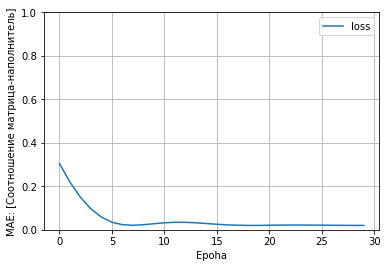

In [146]:
# строим график соотношения матрицы-наполнителя и эпох

plot_loss(model)

In [134]:
# производим сравнение данных

data = pd.DataFrame({'Реальные': [expected_y] , 'Предсказанные': [predicted_y]})
data

,Реальные,Предсказанные
0,"[0.47311609232242424, 0.3387370065800648, 0.77...","[0.4839143503151112, 0.4988271655305738, 0.500..."


In [135]:
res = model.predict(xtest)
print (model.coefs_)
print (model.n_layers_)
print (model.n_outputs_)
print (model.out_activation_)
print ("res: ",res)

[array([[-0.0876637 , -0.04775317, -0.12051363, ..., -0.13805427,
         0.01466467,  0.06971571],
       [-0.11460019, -0.07151205, -0.05689503, ..., -0.05301759,
         0.03625479,  0.02246919],
       [ 0.06265047, -0.06653298, -0.09501349, ...,  0.09780442,
        -0.03995751,  0.10927256],
       ...,
       [-0.09880181,  0.02640399,  0.04937522, ...,  0.12397785,
         0.03640476,  0.08679338],
       [-0.07951641, -0.07703081,  0.09439984, ...,  0.04484183,
        -0.12547365,  0.11743973],
       [-0.04901185,  0.00682428,  0.08112206, ...,  0.06925532,
        -0.09356059, -0.02488699]]), array([[ 0.02200453],
       [-0.04542984],
       [-0.01996546],
       [ 0.0862927 ],
       [ 0.13343489],
       [-0.04589855],
       [-0.1217693 ],
       [ 0.12069952],
       [-0.09842882],
       [ 0.07384528],
       [ 0.03747565],
       [-0.13127374],
       [ 0.0442068 ],
       [-0.01452396],
       [-0.10850475],
       [ 0.05795861],
       [ 0.01766472],
       [ 0.

In [116]:
ytest = [ytest]
ytest = np.array(ytest).reshape(-1,1)
ytest.shape

(281, 1)

In [136]:
model.fit(xtest,  ytest)

Iteration 1, loss = 0.30510161
Iteration 2, loss = 0.21942051
Iteration 3, loss = 0.14982565
Iteration 4, loss = 0.09615787
Iteration 5, loss = 0.05862038
Iteration 6, loss = 0.03467696
Iteration 7, loss = 0.02362480
Iteration 8, loss = 0.02069461
Iteration 9, loss = 0.02349206
Iteration 10, loss = 0.02786248
Iteration 11, loss = 0.03221884
Iteration 12, loss = 0.03449432
Iteration 13, loss = 0.03433610
Iteration 14, loss = 0.03222325
Iteration 15, loss = 0.02879074
Iteration 16, loss = 0.02544182
Iteration 17, loss = 0.02257935
Iteration 18, loss = 0.02105661
Iteration 19, loss = 0.02023259
Iteration 20, loss = 0.02030568
Iteration 21, loss = 0.02099170
Iteration 22, loss = 0.02158025
Iteration 23, loss = 0.02201801
Iteration 24, loss = 0.02203561
Iteration 25, loss = 0.02175748
Iteration 26, loss = 0.02129462
Iteration 27, loss = 0.02078725
Iteration 28, loss = 0.02043470
Iteration 29, loss = 0.02025233
Iteration 30, loss = 0.02022472
Training loss did not improve more than tol=0.000

MLPRegressor(activation='logistic', learning_rate='invscaling', verbose=1)

In [144]:
expected_y  = ytest
predicted_y = model.predict(xtest)

In [138]:


print('MAE, Средняя абсолютная ошибка:', metrics.mean_absolute_error(ytest, predicted_y)) 
print('MSE, Среднеквадратическая ошибка:', metrics.mean_squared_error(ytest, predicted_y)) 
print('RMSE, корень из Среднеквадратическая ошибка:', np.sqrt(metrics.mean_squared_error(ytest, predicted_y)))
print('MSLE Среднеквадратическая логарифмическая ошибка:', metrics.r2_score(ytest, predicted_y))
print('R2 коэффициент детерминации:', metrics.r2_score(ytest, predicted_y))

MAE, Средняя абсолютная ошибка: 0.1645321872091195
MSE, Среднеквадратическая ошибка: 0.04055879937642133
RMSE, корень из Среднеквадратическая ошибка: 0.20139215321462087
MSLE Среднеквадратическая логарифмическая ошибка: 0.006497630016546685
R2 коэффициент детерминации: 0.006497630016546685


In [149]:

def plot_loss(model):
        plt.plot(model.loss_curve_, label = 'loss')
        plt.ylim([0, 0.5])
        plt.xlabel('Epoha')
        plt.ylabel('MAE:[Соотношение матрица-наполнитель]')
        plt.legend()
        plt.grid(True)

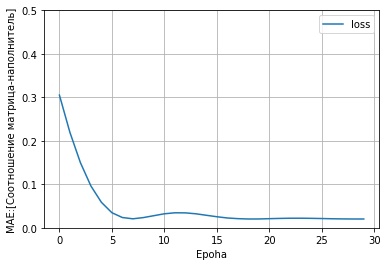

In [150]:
# строим новый график с корректированной осью Y

plot_loss(model)

Коэффициент детерминации близок к 0, что говорит об отсутствии обобщающей способности у этой модели нейросети.
Соотношение матрица-наполнитель эта нейросеть предсказать не может.